Dana Rozenblum & Efrat Magidov

# Image super-resolution exercise #

## Step 1: Create dataset ##

In [10]:
import tarfile
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import os
from PIL import Image
import numpy as np
import itertools
import matplotlib.pyplot as plt
import torch

In [16]:
# Get the data with wget and the URL

!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar

--2021-05-07 19:19:35--  http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
Resolving host.robots.ox.ac.uk (host.robots.ox.ac.uk)... 129.67.94.152
Connecting to host.robots.ox.ac.uk (host.robots.ox.ac.uk)|129.67.94.152|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 460032000 (439M) [application/x-tar]
Saving to: ‘VOCtrainval_06-Nov-2007.tar’

VOCtrainval_06-Nov- 100%[===================>] 438.72M  9.65MB/s    in 48s     

2021-05-07 19:20:24 (9.07 MB/s) - ‘VOCtrainval_06-Nov-2007.tar’ saved [460032000/460032000]



In [17]:
# unzip

tar = tarfile.open("VOCtrainval_06-Nov-2007.tar")
tar.extractall()
tar.close()

!rm -r VOCtrainval_06-Nov-2007.tar

In [19]:
# customize dataset to return the 3 resolutions

class ResolutionDataset(Dataset):

    def __init__(self, input_imgs, transform):

        self.input_imgs = input_imgs
        self.transform = transform

    def __len__(self):
        return len(self.input_imgs)

    def __getitem__(self, idx):
        input_img = self.input_imgs[idx]
        return self.transform['X'](input_img), self.transform['y_mid'](input_img), self.transform['y_large'](input_img)

In [20]:
# create train and test datasets and dataloaders with the required tranforamations

data_transforms = {
    'X': transforms.Compose([
        transforms.Resize((72, 72)),
        transforms.ToTensor()
    ]),
    'y_mid': transforms.Compose([
        transforms.Resize((144, 144)),
        transforms.ToTensor()
    ]),
    'y_large': transforms.Compose([
        transforms.Resize((288, 288)),
        transforms.ToTensor()
    ])
}

images = {}
directory=os.path.join('/content/VOCdevkit/VOC2007', 'JPEGImages')
i = 0

for file in os.listdir(directory):
  im=Image.open(os.path.join('/content/VOCdevkit/VOC2007', 'JPEGImages',file))
  images[i]=im
  i += 1

test_size = 1000
train_size = len(images) - test_size
images_items = images.items()
test_data = dict(itertools.islice(images_items,0, test_size))
train_data_start = dict(itertools.islice(images_items,1000,train_size+test_size))
train_data = {}

for i in range (train_size):
  train_data[i] = train_data_start[i+1000]
  
train_dataset = ResolutionDataset(train_data, data_transforms)
train_loader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=True)
test_dataset = ResolutionDataset(test_data, data_transforms)
test_loader = DataLoader(dataset=test_dataset, batch_size=32, shuffle=False)

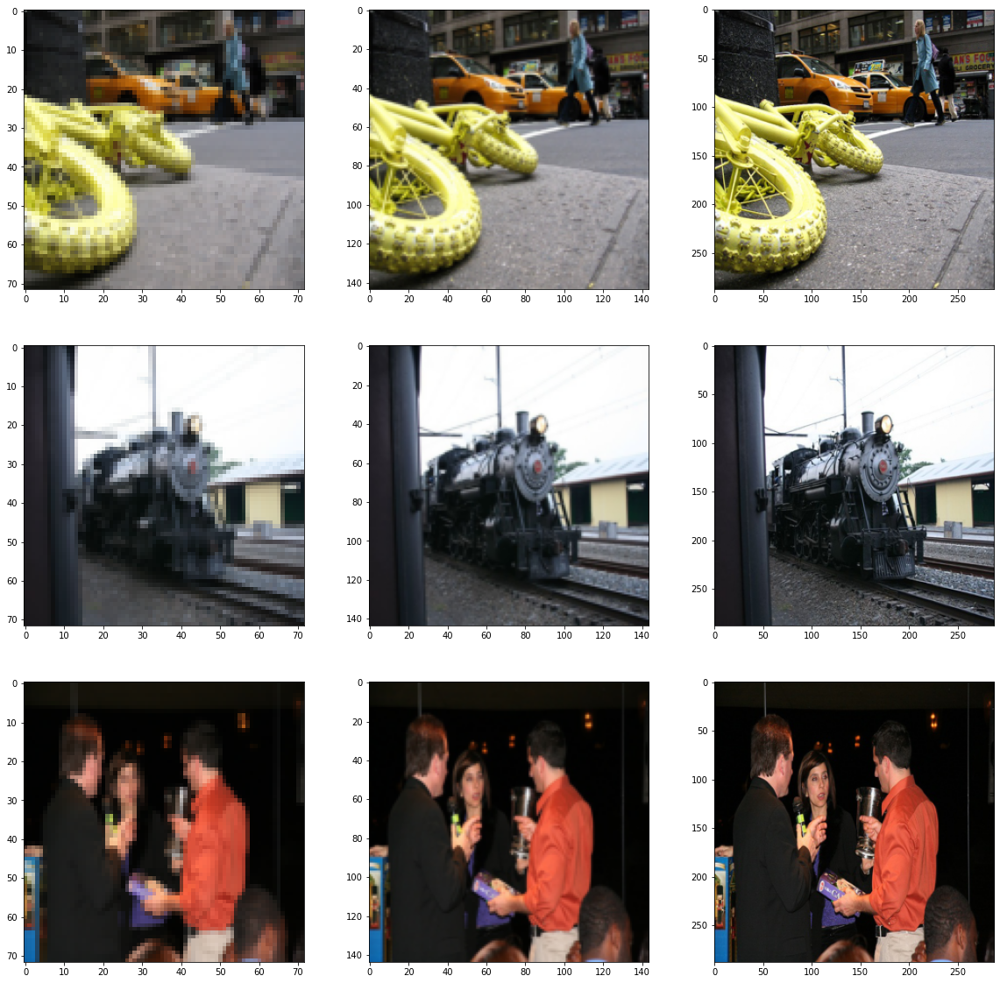

In [ ]:
# plot some images

f, axarr = plt.subplots(3,3,figsize=(20,20))
small_img, mid_img, large_img = train_dataset[0]
axarr[0,0].imshow(small_img.permute(1,2,0))
axarr[0,1].imshow(mid_img.permute(1,2,0))
axarr[0,2].imshow(large_img.permute(1,2,0))
small_img, mid_img, large_img = train_dataset[1]
axarr[1,0].imshow(small_img.permute(1,2,0))
axarr[1,1].imshow(mid_img.permute(1,2,0))
axarr[1,2].imshow(large_img.permute(1,2,0))
small_img, mid_img, large_img = train_dataset[2]
axarr[2,0].imshow(small_img.permute(1,2,0))
axarr[2,1].imshow(mid_img.permute(1,2,0))
axarr[2,2].imshow(large_img.permute(1,2,0))

## Step 2: Create an initial model ##

In [6]:
import torch.nn as nn
import torch.nn.init as init
import torch.optim as optim
import copy

In [7]:
# initial fully convolutional model

class Initial(nn.Module):
    def __init__(self, upscale_factor=2):
        super(Initial, self).__init__()
        self.relu = nn.ReLU()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.upscale = nn.PixelShuffle(upscale_factor)
        self.conv3 = nn.Conv2d(16, 3, kernel_size=(1, 1), stride=(1, 1))
        self._initialize_weights()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.upscale(x)
        x = self.conv3(x)
        return x

    def _initialize_weights(self):
        init.orthogonal_(self.conv1.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv3.weight)

In [22]:
# Check for the availability of a GPU, and use CPU otherwise

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = Initial().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(),lr=0.01)

In [23]:
# train and test methods

def train(epoch):
    epoch_loss = 0

    for iteration, batch in enumerate(train_loader, 1):
        input, target = batch[0].to(device), batch[1].to(device)
        optimizer.zero_grad()
        loss = criterion(model(input), target)
        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()

    print("===> Epoch {} Complete: Avg. Train Loss: {:.4f}".format(epoch, epoch_loss / len(train_loader)))
    return model.state_dict()

def test():
    total_loss = 0
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            input, target = batch[0].to(device), batch[1].to(device)
            prediction = model(input)
            mse = criterion(prediction, target)
            total_loss += mse.item()
            
    avg_mse = total_loss / len(test_loader)
    print("===> Avg. Test Loss: {:.4f}".format(avg_mse))
    return avg_mse

In [24]:
# train and save the best model

best_mse = np.Inf

for epoch in range(1, 21):
    curr_model = train(epoch)
    curr_loss = test()

    if (curr_loss < best_mse):
      best_mse = curr_loss
      best_model_initial = copy.deepcopy(curr_model)

===> Epoch 1 Complete: Avg. Train Loss: 0.0200
===> Avg. Test Loss: 0.0033
===> Epoch 2 Complete: Avg. Train Loss: 0.0024
===> Avg. Test Loss: 0.0019
===> Epoch 3 Complete: Avg. Train Loss: 0.0018
===> Avg. Test Loss: 0.0017
===> Epoch 4 Complete: Avg. Train Loss: 0.0016
===> Avg. Test Loss: 0.0015
===> Epoch 5 Complete: Avg. Train Loss: 0.0015
===> Avg. Test Loss: 0.0016
===> Epoch 6 Complete: Avg. Train Loss: 0.0014
===> Avg. Test Loss: 0.0016
===> Epoch 7 Complete: Avg. Train Loss: 0.0015
===> Avg. Test Loss: 0.0013
===> Epoch 8 Complete: Avg. Train Loss: 0.0014
===> Avg. Test Loss: 0.0013
===> Epoch 9 Complete: Avg. Train Loss: 0.0013
===> Avg. Test Loss: 0.0013
===> Epoch 10 Complete: Avg. Train Loss: 0.0014
===> Avg. Test Loss: 0.0013
===> Epoch 11 Complete: Avg. Train Loss: 0.0013
===> Avg. Test Loss: 0.0012
===> Epoch 12 Complete: Avg. Train Loss: 0.0013
===> Avg. Test Loss: 0.0013
===> Epoch 13 Complete: Avg. Train Loss: 0.0013
===> Avg. Test Loss: 0.0013
===> Epoch 14 Complet

## Step 3: Add another upsampling path ##

In [48]:
# add another block to your model so that you’ll have both 144x144x3 output along with 288x288x3 output

class TwoPaths(nn.Module):
    def __init__(self, upscale_factor=2):
        super(TwoPaths, self).__init__()
        self.relu = nn.ReLU()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.upscale = nn.PixelShuffle(upscale_factor)
        self.conv31 = nn.Conv2d(16, 3, kernel_size=(1, 1), stride=(1, 1))
        self.conv32 = nn.Conv2d(4, 3, kernel_size=(1, 1), stride=(1, 1))
        self._initialize_weights()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.upscale(x)
        x1 = self.conv31(x)
        x2 = self.upscale(x)
        x2 = self.conv32(x2)
        return x1, x2

    def _initialize_weights(self):
        init.orthogonal_(self.conv1.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv31.weight)
        init.orthogonal_(self.conv32.weight)

In [49]:
# create the model

model = TwoPaths().to(device)
optimizer = optim.Adam(model.parameters(),lr=0.01)

In [50]:
# train and test methods

def train(epoch):
    epoch_loss = 0

    for iteration, batch in enumerate(train_loader, 1):
        input, target1, target2 = batch[0].to(device), batch[1].to(device), batch[2].to(device)
        optimizer.zero_grad()
        pred1, pred2 = model(input)
        loss1 = criterion(pred1, target1)
        loss2 = criterion(pred2, target2)
        loss = loss1 + loss2
        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()

    print("===> Epoch {} Complete: Avg. Train Loss: {:.4f}".format(epoch, epoch_loss / len(train_loader)))
    return model.state_dict()


def test():
    total_loss = 0
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            input, target1, target2 = batch[0].to(device), batch[1].to(device), batch[2].to(device)
            prediction1, prediction2 = model(input)
            mse = criterion(prediction1, target1) + criterion(prediction2, target2)
            total_loss += mse.item()
            
    avg_mse = total_loss / len(test_loader)
    print("===> Avg. Test Loss: {:.4f}".format(avg_mse))
    return avg_mse

In [51]:
# train and save the best model

best_mse = np.Inf

for epoch in range(1, 21):
    curr_model = train(epoch)
    curr_loss = test()

    if (curr_loss < best_mse):
      best_mse = curr_loss
      best_model_twopath = copy.deepcopy(curr_model)

===> Epoch 1 Complete: Avg. Train Loss: 0.0829
===> Avg. Test Loss: 0.0421
===> Epoch 2 Complete: Avg. Train Loss: 0.0411
===> Avg. Test Loss: 0.0390
===> Epoch 3 Complete: Avg. Train Loss: 0.0398
===> Avg. Test Loss: 0.0384
===> Epoch 4 Complete: Avg. Train Loss: 0.0390
===> Avg. Test Loss: 0.0375
===> Epoch 5 Complete: Avg. Train Loss: 0.0377
===> Avg. Test Loss: 0.0373
===> Epoch 6 Complete: Avg. Train Loss: 0.0370
===> Avg. Test Loss: 0.0358
===> Epoch 7 Complete: Avg. Train Loss: 0.0366
===> Avg. Test Loss: 0.0355
===> Epoch 8 Complete: Avg. Train Loss: 0.0366
===> Avg. Test Loss: 0.0355
===> Epoch 9 Complete: Avg. Train Loss: 0.0364
===> Avg. Test Loss: 0.0354
===> Epoch 10 Complete: Avg. Train Loss: 0.0365
===> Avg. Test Loss: 0.0371
===> Epoch 11 Complete: Avg. Train Loss: 0.0362
===> Avg. Test Loss: 0.0353
===> Epoch 12 Complete: Avg. Train Loss: 0.0363
===> Avg. Test Loss: 0.0369
===> Epoch 13 Complete: Avg. Train Loss: 0.0365
===> Avg. Test Loss: 0.0354
===> Epoch 14 Complet

## Step 4: Add residual blocks into the process ##

In [59]:
# network with residul blocks

class Residuals(nn.Module):
    def __init__(self, upscale_factor=2):
        super(Residuals, self).__init__()
        self.relu = nn.ReLU()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1))
        self.conv2 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv3 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv4 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv5 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.upscale = nn.PixelShuffle(upscale_factor)
        self.conv6 = nn.Conv2d(8, 3, kernel_size=(1, 1), stride=(1, 1))
        self.conv7 = nn.Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
        self.conv8 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv9 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv10 = nn.Conv2d(8, 3, kernel_size=(1, 1), stride=(1, 1))
        self._initialize_weights()

    def forward(self, x):
        x = self.conv1(x)
        residuals = x
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x += residuals

        residuals = x
        x = self.relu(self.conv4(x))
        x = self.relu(self.conv5(x))
        x += residuals

        x = self.upscale(x)
        x1 = self.conv6(x)
        
        x2 = self.conv7(x)
        residuals = x2
        x = self.relu(self.conv8(x2))
        x = self.relu(self.conv9(x2))
        x2 += residuals
      
        x2 = self.upscale(x2)
        x2 = self.conv10(x2)
        return x1, x2

    def _initialize_weights(self):
        init.orthogonal_(self.conv1.weight)
        init.orthogonal_(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv3.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv4.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv5.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv6.weight)
        init.orthogonal_(self.conv7.weight)
        init.orthogonal_(self.conv8.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv9.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv10.weight)

In [60]:
# create the model

model = Residuals().to(device)
optimizer = optim.Adam(model.parameters(),lr=0.01)

In [61]:
# train and save the best model

best_mse = np.Inf

for epoch in range(1, 21):
    curr_model = train(epoch)
    curr_loss = test()

    if (curr_loss < best_mse):
      best_mse = curr_loss
      best_model_residuals = copy.deepcopy(curr_model)

===> Epoch 1 Complete: Avg. Train Loss: 0.0871
===> Avg. Test Loss: 0.0175
===> Epoch 2 Complete: Avg. Train Loss: 0.0156
===> Avg. Test Loss: 0.0122
===> Epoch 3 Complete: Avg. Train Loss: 0.0101
===> Avg. Test Loss: 0.0079
===> Epoch 4 Complete: Avg. Train Loss: 0.0072
===> Avg. Test Loss: 0.0062
===> Epoch 5 Complete: Avg. Train Loss: 0.0061
===> Avg. Test Loss: 0.0062
===> Epoch 6 Complete: Avg. Train Loss: 0.0058
===> Avg. Test Loss: 0.0059
===> Epoch 7 Complete: Avg. Train Loss: 0.0055
===> Avg. Test Loss: 0.0054
===> Epoch 8 Complete: Avg. Train Loss: 0.0061
===> Avg. Test Loss: 0.0053
===> Epoch 9 Complete: Avg. Train Loss: 0.0052
===> Avg. Test Loss: 0.0051
===> Epoch 10 Complete: Avg. Train Loss: 0.0052
===> Avg. Test Loss: 0.0052
===> Epoch 11 Complete: Avg. Train Loss: 0.0051
===> Avg. Test Loss: 0.0054
===> Epoch 12 Complete: Avg. Train Loss: 0.0051
===> Avg. Test Loss: 0.0050
===> Epoch 13 Complete: Avg. Train Loss: 0.0051
===> Avg. Test Loss: 0.0049
===> Epoch 14 Complet

## (optional) Step 5: replace the residual blocks we defined above with a dilated (Atrous) convolutional block ##

In [119]:
# network with dilation blocks

class Dilation(nn.Module):
    def __init__(self, upscale_factor=2):
        super(Dilation, self).__init__()
        self.relu = nn.ReLU()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1))
        self.conv2 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), dilation=1)
        self.conv3 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=2)
        self.conv4 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(4, 4), dilation=4)
        self.conv5 = nn.Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), dilation=1)
        self.conv6 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=2)
        self.conv7 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(4, 4), dilation=4)
        self.upscale = nn.PixelShuffle(upscale_factor)
        self.conv8 = nn.Conv2d(24, 3, kernel_size=(1, 1), stride=(1, 1))
        self.conv9 = nn.Conv2d(24, 32, kernel_size=(1, 1), stride=(1, 1))
        self.conv10 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), dilation=1)
        self.conv11 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=2)
        self.conv12 = nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(4, 4), dilation=4)
        self.conv13 = nn.Conv2d(24, 3, kernel_size=(1, 1), stride=(1, 1))
        self._initialize_weights()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(self.conv2(x))
        x1 = self.relu(self.conv3(x))
        x2 = self.relu(self.conv4(x1))
        x = torch.cat((x, x1, x2), 1)

        x = self.relu(self.conv5(x))
        x1 = self.relu(self.conv6(x))
        x2 = self.relu(self.conv7(x1))
        x = torch.cat((x, x1, x2), 1)

        x = self.upscale(x)
        out1 = self.conv8(x)
        
        x = self.conv9(x)
        x = self.relu(self.conv10(x))
        x1 = self.relu(self.conv11(x))
        x2 = self.relu(self.conv12(x1))
        x = torch.cat((x, x1, x2), 1)
      
        x = self.upscale(x)
        out2 = self.conv13(x)
        
        return out1, out2

    def _initialize_weights(self):
        init.orthogonal_(self.conv1.weight)
        init.orthogonal_(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv3.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv4.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv5.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv6.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv7.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv8.weight)
        init.orthogonal_(self.conv9.weight)
        init.orthogonal_(self.conv10.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv11.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv12.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv13.weight)

In [120]:
# create the model

model = Dilation().to(device)
optimizer = optim.Adam(model.parameters(),lr=0.01)

In [121]:
# train and save the best model

best_mse = np.Inf

for epoch in range(1, 21):
    curr_model = train(epoch)
    curr_loss = test()

    if (curr_loss < best_mse):
      best_mse = curr_loss
      best_model_dilation = copy.deepcopy(curr_model)

===> Epoch 1 Complete: Avg. Train Loss: 0.0942
===> Avg. Test Loss: 0.0263
===> Epoch 2 Complete: Avg. Train Loss: 0.0249
===> Avg. Test Loss: 0.0204
===> Epoch 3 Complete: Avg. Train Loss: 0.0209
===> Avg. Test Loss: 0.0152
===> Epoch 4 Complete: Avg. Train Loss: 0.0137
===> Avg. Test Loss: 0.0101
===> Epoch 5 Complete: Avg. Train Loss: 0.0104
===> Avg. Test Loss: 0.0090
===> Epoch 6 Complete: Avg. Train Loss: 0.0095
===> Avg. Test Loss: 0.0088
===> Epoch 7 Complete: Avg. Train Loss: 0.0091
===> Avg. Test Loss: 0.0091
===> Epoch 8 Complete: Avg. Train Loss: 0.0091
===> Avg. Test Loss: 0.0084
===> Epoch 9 Complete: Avg. Train Loss: 0.0088
===> Avg. Test Loss: 0.0082
===> Epoch 10 Complete: Avg. Train Loss: 0.0085
===> Avg. Test Loss: 0.0085
===> Epoch 11 Complete: Avg. Train Loss: 0.0083
===> Avg. Test Loss: 0.0076
===> Epoch 12 Complete: Avg. Train Loss: 0.0080
===> Avg. Test Loss: 0.0074
===> Epoch 13 Complete: Avg. Train Loss: 0.0077
===> Avg. Test Loss: 0.0071
===> Epoch 14 Complet

## (optional) Step 6: Add a pretrained network ##

In [69]:
import torchvision.models as models

In [70]:
# add another block to your model so that you’ll have both 144x144x3 output along with 288x288x3 output

class Pretrained(nn.Module):
    def __init__(self, upscale_factor=2):
        super(Pretrained, self).__init__()
        self.relu = nn.ReLU()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.upscale = nn.PixelShuffle(upscale_factor)
        self.conv31 = nn.Conv2d(20, 3, kernel_size=(1, 1), stride=(1, 1))
        self.conv32 = nn.Conv2d(5, 3, kernel_size=(1, 1), stride=(1, 1))
        self._initialize_weights()
        resnet50 = models.resnext50_32x4d(pretrained=True)
        self.features = nn.Sequential(*(list(resnet50.children())[0:5])).to(device)
        self.res_pixel_shuffle = nn.PixelShuffle(4)

    def forward(self, x):
        x1 = self.relu(self.conv1(x))
        x1 = self.relu(self.conv2(x1))
        x2 = self.features(x)
        x2 = self.res_pixel_shuffle(x2)
        x = torch.cat((x1, x2), 1)
        x = self.upscale(x)
        x1 = self.conv31(x)
        x2 = self.upscale(x)
        x2 = self.conv32(x2)
        return x1, x2

    def _initialize_weights(self):
        init.orthogonal_(self.conv1.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv31.weight)
        init.orthogonal_(self.conv32.weight)

In [71]:
# create the model

model = Pretrained().to(device)
optimizer = optim.Adam(model.parameters(),lr=0.01)

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth


In [72]:
# train and save the best model

best_mse = np.Inf

for epoch in range(1, 21):
    curr_model = train(epoch)
    curr_loss = test()

    if (curr_loss < best_mse):
      best_mse = curr_loss
      best_model_pretrained = copy.deepcopy(curr_model)

===> Epoch 1 Complete: Avg. Train Loss: 0.0428
===> Avg. Test Loss: 0.0264
===> Epoch 2 Complete: Avg. Train Loss: 0.0184
===> Avg. Test Loss: 0.0120
===> Epoch 3 Complete: Avg. Train Loss: 0.0117
===> Avg. Test Loss: 0.0103
===> Epoch 4 Complete: Avg. Train Loss: 0.0104
===> Avg. Test Loss: 0.0093
===> Epoch 5 Complete: Avg. Train Loss: 0.0097
===> Avg. Test Loss: 0.0093
===> Epoch 6 Complete: Avg. Train Loss: 0.0093
===> Avg. Test Loss: 0.0085
===> Epoch 7 Complete: Avg. Train Loss: 0.0090
===> Avg. Test Loss: 0.0083
===> Epoch 8 Complete: Avg. Train Loss: 0.0087
===> Avg. Test Loss: 0.0081
===> Epoch 9 Complete: Avg. Train Loss: 0.0086
===> Avg. Test Loss: 0.0080
===> Epoch 10 Complete: Avg. Train Loss: 0.0083
===> Avg. Test Loss: 0.0069
===> Epoch 11 Complete: Avg. Train Loss: 0.0073
===> Avg. Test Loss: 0.0070
===> Epoch 12 Complete: Avg. Train Loss: 0.0073
===> Avg. Test Loss: 0.0066
===> Epoch 13 Complete: Avg. Train Loss: 0.0070
===> Avg. Test Loss: 0.0068
===> Epoch 14 Complet

## Summary: ##

### Initial model ###

In [43]:
import math

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


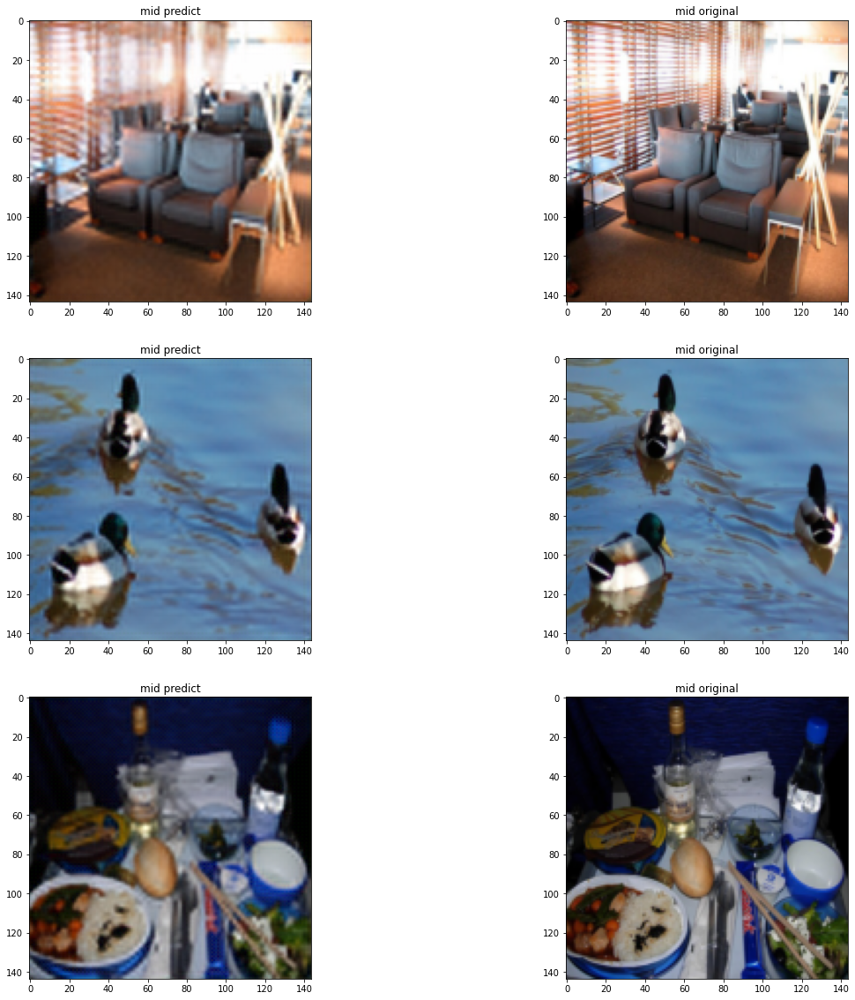

In [33]:
# plot some images

model = Initial()
model.load_state_dict(best_model_initial)
inputs, real_mid, real_high = next(iter(test_loader))
initial_mid = model(inputs)
f, axarr = plt.subplots(3,2,figsize=(20,20))

for i in range(3):
  pred = initial_mid[i].detach()
  real = real_mid[i]
  axarr[i,0].imshow(pred.permute(1,2,0))
  axarr[i,0].set_title(label="mid predict")
  axarr[i,1].imshow(real.permute(1,2,0))
  axarr[i,1].set_title(label="mid original")

In [40]:
# method to get model predictions

def get_predictions(model, data_loader):
    model.eval()
    predictions = []
    real_values = []
  
    with torch.no_grad():
    
        for inputs, labels, _ in data_loader:
            labels = labels.to(device)
            outputs = model(inputs).to(device)
            predictions.extend(outputs)
            real_values.extend(labels)

    return predictions, real_values

In [45]:
# calculate mse and psnr

preds, real = get_predictions(model, test_loader)
mse = torch.mean(torch.square(torch.stack(preds) - torch.stack(real)))
print("MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("PSNR:", psnr)

MSE: 0.0011362627847120166
PSNR: 29.445212172585173


### TwoPaths model ###

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


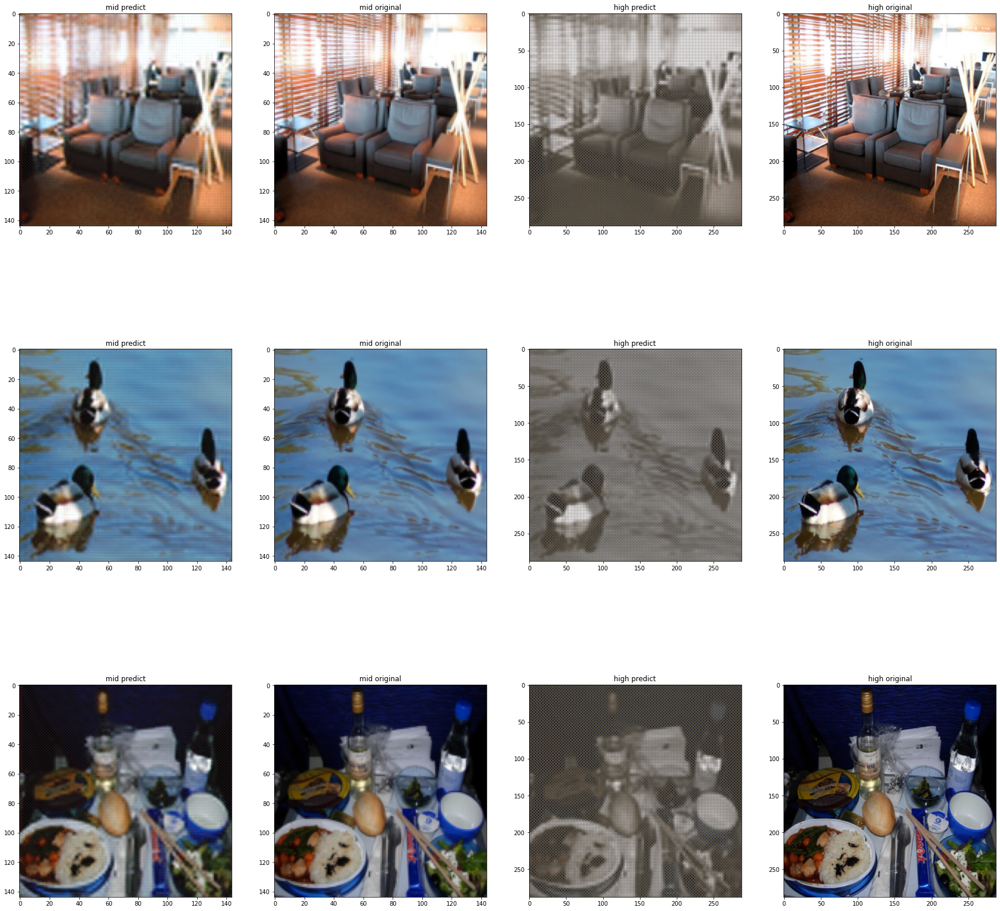

In [52]:
# plot some images

model = TwoPaths()
model.load_state_dict(best_model_twopath)
inputs, real_mid, real_high = next(iter(test_loader))
tp_mid, tp_high = model(inputs)
f, axarr = plt.subplots(3,4,figsize=(30,30))

for i in range(3):
  pred_mid = tp_mid[i].detach()
  pred_high = tp_high[i].detach()
  real_m = real_mid[i]
  real_h = real_high[i]
  axarr[i,0].imshow(pred_mid.permute(1,2,0))
  axarr[i,0].set_title(label="mid predict")
  axarr[i,1].imshow(real_m.permute(1,2,0))
  axarr[i,1].set_title(label="mid original")
  axarr[i,2].imshow(pred_high.permute(1,2,0))
  axarr[i,2].set_title(label="high predict")
  axarr[i,3].imshow(real_h.permute(1,2,0))
  axarr[i,3].set_title(label="high original")

In [124]:
# method to get model predictions

def get_predictions(model, data_loader):
    model.eval()
    predictions_mid = []
    predictions_high = []
    real_values_mid = []
    real_values_high = []
  
    with torch.no_grad():
    
        for inputs, labelsm, labelsh in data_loader:
            labelsm = labelsm.to(device)
            labelsh = labelsh.to(device)
            outputsm, outputsh = model(inputs)
            outputsm = outputsm.to(device)
            outputsh = outputsh.to(device)
            predictions_mid.extend(outputsm)
            predictions_high.extend(outputsh)
            real_values_mid.extend(labelsm)
            real_values_high.extend(labelsh)

    return predictions_mid, real_values_mid, predictions_high, real_values_high

In [58]:
# calculate mse and psnr

predsm, realm, predsh, realh = get_predictions(model, test_loader)
mse = torch.mean(torch.square(torch.stack(predsm) - torch.stack(realm)))
print("Mid resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("Mid resolution PSNR:", psnr)
mse = torch.mean(torch.square(torch.stack(predsh) - torch.stack(realh)))
print("\nHigh resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("High resolution PSNR:", psnr)

Mid resolution MSE: 0.0016862470656633377
Mid resolution PSNR: 27.730787930604865

High resolution MSE: 0.03321925178170204
High resolution PSNR: 14.78610153664803


### Residuals model ###

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


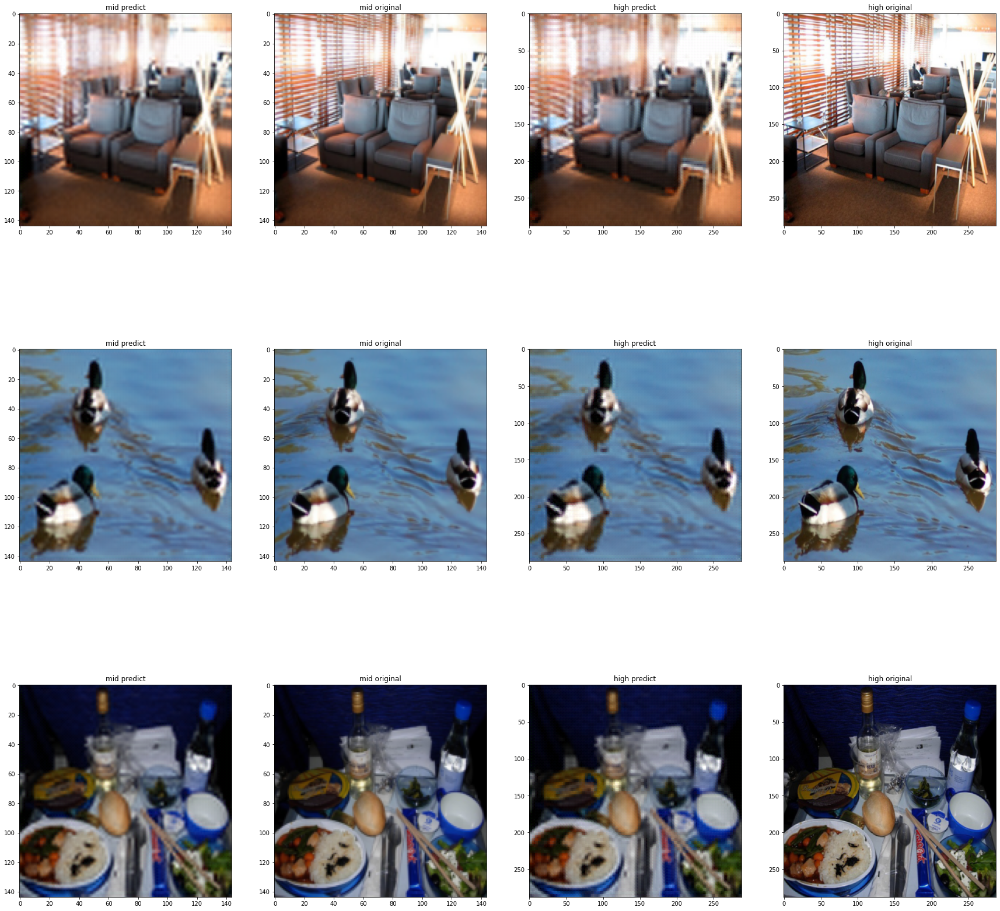

In [62]:
# plot some images

model = Residuals()
model.load_state_dict(best_model_residuals)
inputs, real_mid, real_high = next(iter(test_loader))
tp_mid, tp_high = model(inputs)
f, axarr = plt.subplots(3,4,figsize=(30,30))

for i in range(3):
  pred_mid = tp_mid[i].detach()
  pred_high = tp_high[i].detach()
  real_m = real_mid[i]
  real_h = real_high[i]
  axarr[i,0].imshow(pred_mid.permute(1,2,0))
  axarr[i,0].set_title(label="mid predict")
  axarr[i,1].imshow(real_m.permute(1,2,0))
  axarr[i,1].set_title(label="mid original")
  axarr[i,2].imshow(pred_high.permute(1,2,0))
  axarr[i,2].set_title(label="high predict")
  axarr[i,3].imshow(real_h.permute(1,2,0))
  axarr[i,3].set_title(label="high original")

In [63]:
# calculate mse and psnr

predsm, realm, predsh, realh = get_predictions(model, test_loader)
mse = torch.mean(torch.square(torch.stack(predsm) - torch.stack(realm)))
print("Mid resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("Mid resolution PSNR:", psnr)
mse = torch.mean(torch.square(torch.stack(predsh) - torch.stack(realh)))
print("\nHigh resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("High resolution PSNR:", psnr)

Mid resolution MSE: 0.0012185308150947094
Mid resolution PSNR: 29.14163483585229

High resolution MSE: 0.003512891475111246
High resolution PSNR: 24.543352668001624


### (Optional) Dilation model ###

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


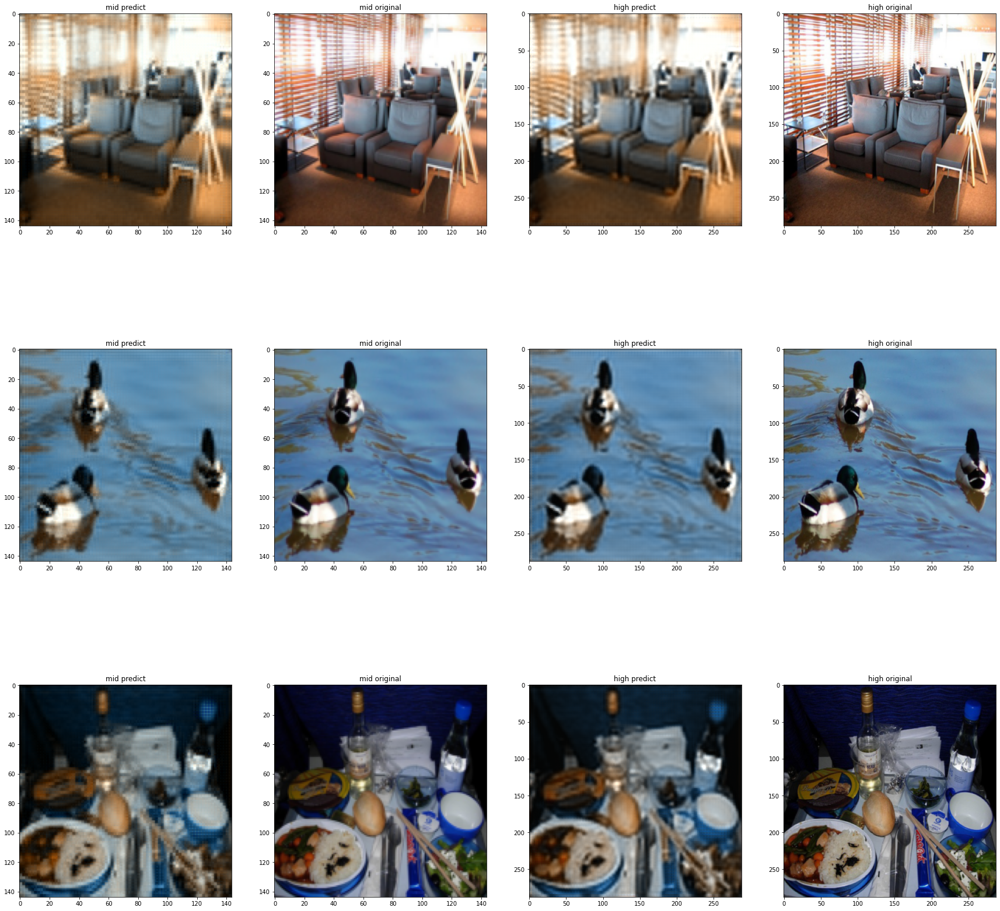

In [122]:
# plot some images

model = Dilation()
model.load_state_dict(best_model_dilation)
inputs, real_mid, real_high = next(iter(test_loader))
tp_mid, tp_high = model(inputs)
f, axarr = plt.subplots(3,4,figsize=(30,30))

for i in range(3):
  pred_mid = tp_mid[i].detach()
  pred_high = tp_high[i].detach()
  real_m = real_mid[i]
  real_h = real_high[i]
  axarr[i,0].imshow(pred_mid.permute(1,2,0))
  axarr[i,0].set_title(label="mid predict")
  axarr[i,1].imshow(real_m.permute(1,2,0))
  axarr[i,1].set_title(label="mid original")
  axarr[i,2].imshow(pred_high.permute(1,2,0))
  axarr[i,2].set_title(label="high predict")
  axarr[i,3].imshow(real_h.permute(1,2,0))
  axarr[i,3].set_title(label="high original")

In [127]:
# calculate mse and psnr

predsm, realm, predsh, realh = get_predictions(model, test_loader)
mse = torch.mean(torch.square(torch.stack(predsm) - torch.stack(realm)))
print("Mid resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("Mid resolution PSNR:", psnr)
mse = torch.mean(torch.square(torch.stack(predsh).cpu() - torch.stack(realh).cpu()))
print("\nHigh resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("High resolution PSNR:", psnr)

Mid resolution MSE: 0.00239751604385674
Mid resolution PSNR: 26.20238477906981

High resolution MSE: 0.004243155941367149
High resolution PSNR: 23.723110070665783


### (Optional) Pretrained model ###

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


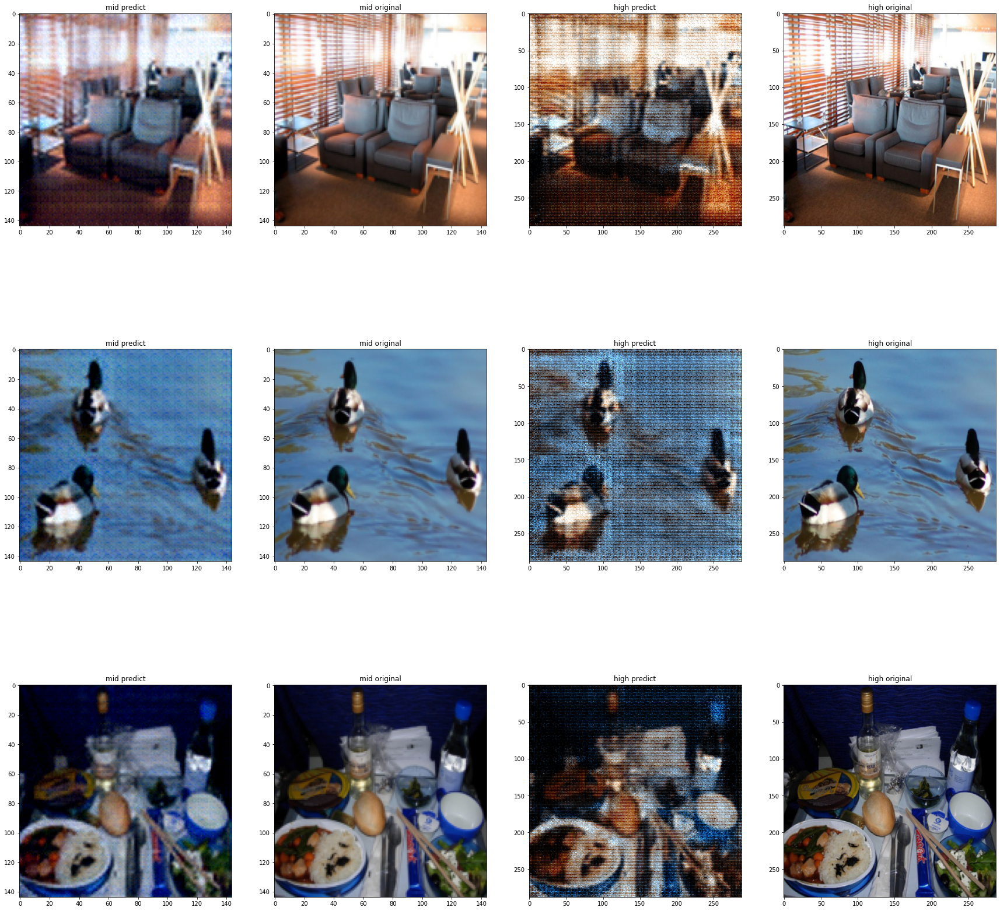

In [79]:
# plot some images

model = Pretrained().to(device)
model.load_state_dict(best_model_pretrained)
inputs, real_mid, real_high = next(iter(test_loader))
inputs = inputs.to(device)
tp_mid, tp_high = model(inputs)
f, axarr = plt.subplots(3,4,figsize=(30,30))

for i in range(3):
  pred_mid = tp_mid[i].detach().cpu()
  pred_high = tp_high[i].detach().cpu()
  real_m = real_mid[i]
  real_h = real_high[i]
  axarr[i,0].imshow(pred_mid.permute(1,2,0))
  axarr[i,0].set_title(label="mid predict")
  axarr[i,1].imshow(real_m.permute(1,2,0))
  axarr[i,1].set_title(label="mid original")
  axarr[i,2].imshow(pred_high.permute(1,2,0))
  axarr[i,2].set_title(label="high predict")
  axarr[i,3].imshow(real_h.permute(1,2,0))
  axarr[i,3].set_title(label="high original")

In [81]:
# method to get model predictions

def get_predictions(model, data_loader):
    model.eval()
    predictions_mid = []
    predictions_high = []
    real_values_mid = []
    real_values_high = []
  
    with torch.no_grad():
    
        for inputs, labelsm, labelsh in data_loader:
            labelsm = labelsm.to(device)
            labelsh = labelsh.to(device)
            inputs = inputs.to(device)
            outputsm, outputsh = model(inputs)
            outputsm = outputsm.to(device)
            outputsh = outputsh.to(device)
            predictions_mid.extend(outputsm)
            predictions_high.extend(outputsh)
            real_values_mid.extend(labelsm)
            real_values_high.extend(labelsh)

    return predictions_mid, real_values_mid, predictions_high, real_values_high

In [82]:
# calculate mse and psnr

predsm, realm, predsh, realh = get_predictions(model, test_loader)
mse = torch.mean(torch.square(torch.stack(predsm) - torch.stack(realm)))
print("Mid resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("Mid resolution PSNR:", psnr)
mse = torch.mean(torch.square(torch.stack(predsh) - torch.stack(realh)))
print("\nHigh resolution MSE:", mse.item())
psnr = 10 * math.log10(1 / mse.item())
print("High resolution PSNR:", psnr)

Mid resolution MSE: 0.0013274544617161155
Mid resolution PSNR: 28.769803684496026

High resolution MSE: 0.005037497729063034
High resolution PSNR: 22.977851366335862


To conclude the results:

For generating mid resolution our initial model performs best.

For generating high resolution the best model is the one with the residual blocks.

The worst model was the optional implementation of the dilation blocks (this is probably caused by some code issue since the networks doesn't converge and the outputs are worst than the inputs).